In [ ]:
'''
1. Original implementation from https://github.com/keras-team/keras-io/blob/master/examples/generative/cyclegan.py
2. Loss functions from https://github.com/Tandon-A/CycleGAN_ssim
'''

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


/content/drive/.shortcut-targets-by-id/1MLVKwW4SaYmE_Sxwm1mPCXNOBsMn_eqU/CycleGAN


In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

import tensorflow_addons as tfa
import tensorflow_datasets as tfds
from tensorflow.keras.metrics import MeanIoU as MeanIoU
tfds.disable_progress_bar()
autotune = tf.data.experimental.AUTOTUNE


In [ ]:
G_loss= []
F_loss=[]
Dx_loss=[]
Dy_loss=[]

In [ ]:
# Load the horse-zebra dataset using tensorflow-datasets.
dataset, _ = tfds.load("cycle_gan/horse2zebra", with_info=True, as_supervised=True)
train_horses, train_zebras = dataset["trainA"], dataset["trainB"]
test_horses, test_zebras = dataset["testA"], dataset["testB"]

# Define the standard image size.
orig_img_size = (286, 286)
# Size of the random crops to be used during training.
input_img_size = (256, 256, 3)
# Weights initializer for the layers.
kernel_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)
# Gamma initializer for instance normalization.
gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

buffer_size = 256
batch_size = 1


def normalize_img(img):
    img = tf.cast(img, dtype=tf.float32)
    # Map values in the range [-1, 1]
    return (img / 127.5) - 1.0


def preprocess_train_image(img, label):
    # Random flip
    img = tf.image.random_flip_left_right(img)
    # Resize to the original size first
    img = tf.image.resize(img, [*orig_img_size])
    # Random crop to 256X256
    img = tf.image.random_crop(img, size=[*input_img_size])
    # Normalize the pixel values in the range [-1, 1]
    img = normalize_img(img)
    return img


def preprocess_test_image(img, label):
    # Only resizing and normalization for the test images.
    img = tf.image.resize(img, [input_img_size[0], input_img_size[1]])
    img = normalize_img(img)
    return img


Shuffling and writing examples to /root/tensorflow_datasets/cycle_gan/horse2zebra/2.0.0.incompleteGYY492/cycle_gan-trainA.tfrecord
Shuffling and writing examples to /root/tensorflow_datasets/cycle_gan/horse2zebra/2.0.0.incompleteGYY492/cycle_gan-trainB.tfrecord
Shuffling and writing examples to /root/tensorflow_datasets/cycle_gan/horse2zebra/2.0.0.incompleteGYY492/cycle_gan-testA.tfrecord
Shuffling and writing examples to /root/tensorflow_datasets/cycle_gan/horse2zebra/2.0.0.incompleteGYY492/cycle_gan-testB.tfrecord
Dataset cycle_gan downloaded and prepared to /root/tensorflow_datasets/cycle_gan/horse2zebra/2.0.0. Subsequent calls will reuse this data.


In [ ]:

# Apply the preprocessing operations to the training data
train_horses = (
    train_horses.map(preprocess_train_image, num_parallel_calls=autotune)
    .cache()
    .shuffle(buffer_size)
    .batch(batch_size)
)
train_zebras = (
    train_zebras.map(preprocess_train_image, num_parallel_calls=autotune)
    .cache()
    .shuffle(buffer_size)
    .batch(batch_size)
)

# Apply the preprocessing operations to the test data
test_horses = (
    test_horses.map(preprocess_test_image, num_parallel_calls=autotune)
    .cache()
    .shuffle(buffer_size)
    .batch(batch_size)
)
test_zebras = (
    test_zebras.map(preprocess_test_image, num_parallel_calls=autotune)
    .cache()
    .shuffle(buffer_size)
    .batch(batch_size)
)


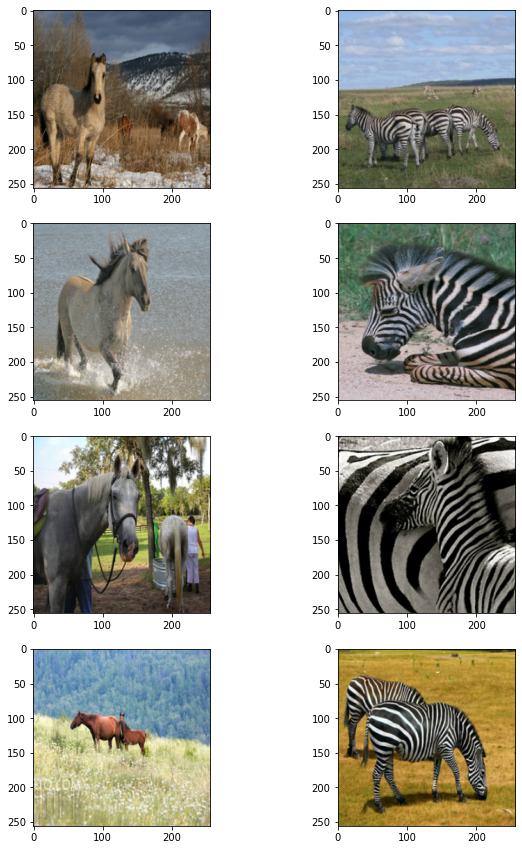

In [ ]:

_, ax = plt.subplots(4, 2, figsize=(10, 15))
for i, samples in enumerate(zip(train_horses.take(4), train_zebras.take(4))):
    horse = (((samples[0][0] * 127.5) + 127.5).numpy()).astype(np.uint8)
    zebra = (((samples[1][0] * 127.5) + 127.5).numpy()).astype(np.uint8)
    ax[i, 0].imshow(horse)
    ax[i, 1].imshow(zebra)
plt.show()


In [ ]:

class ReflectionPadding2D(layers.Layer):
    """Implements Reflection Padding as a layer.

    Args:
        padding(tuple): Amount of padding for the
        spatial dimensions.

    Returns:
        A padded tensor with the same type as the input tensor.
    """

    def __init__(self, padding=(1, 1), **kwargs):
        self.padding = tuple(padding)
        super(ReflectionPadding2D, self).__init__(**kwargs)

    def call(self, input_tensor, mask=None):
        padding_width, padding_height = self.padding
        padding_tensor = [
            [0, 0],
            [padding_height, padding_height],
            [padding_width, padding_width],
            [0, 0],
        ]
        return tf.pad(input_tensor, padding_tensor, mode="REFLECT")


def residual_block(
    x,
    activation,
    kernel_initializer=kernel_init,
    kernel_size=(3, 3),
    strides=(1, 1),
    padding="valid",
    gamma_initializer=gamma_init,
    use_bias=False,
):
    dim = x.shape[-1]
    input_tensor = x

    x = ReflectionPadding2D()(input_tensor)
    x = layers.Conv2D(
        dim,
        kernel_size,
        strides=strides,
        kernel_initializer=kernel_initializer,
        padding=padding,
        use_bias=use_bias,
    )(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    x = activation(x)

    x = ReflectionPadding2D()(x)
    x = layers.Conv2D(
        dim,
        kernel_size,
        strides=strides,
        kernel_initializer=kernel_initializer,
        padding=padding,
        use_bias=use_bias,
    )(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    x = layers.add([input_tensor, x])
    return x


def downsample(
    x,
    filters,
    activation,
    kernel_initializer=kernel_init,
    kernel_size=(3, 3),
    strides=(2, 2),
    padding="same",
    gamma_initializer=gamma_init,
    use_bias=False,
):
    x = layers.Conv2D(
        filters,
        kernel_size,
        strides=strides,
        kernel_initializer=kernel_initializer,
        padding=padding,
        use_bias=use_bias,
    )(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    if activation:
        x = activation(x)
    return x


def upsample(
    x,
    filters,
    activation,
    kernel_size=(3, 3),
    strides=(2, 2),
    padding="same",
    kernel_initializer=kernel_init,
    gamma_initializer=gamma_init,
    use_bias=False,
):
    x = layers.Conv2DTranspose(
        filters,
        kernel_size,
        strides=strides,
        padding=padding,
        kernel_initializer=kernel_initializer,
        use_bias=use_bias,
    )(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    if activation:
        x = activation(x)
    return x


In [ ]:

def get_resnet_generator(
    filters=64,
    num_downsampling_blocks=2,
    num_residual_blocks=9,
    num_upsample_blocks=2,
    gamma_initializer=gamma_init,
    name=None,
):
    img_input = layers.Input(shape=input_img_size, name=name + "_img_input")
    x = ReflectionPadding2D(padding=(3, 3))(img_input)
    x = layers.Conv2D(filters, (7, 7), kernel_initializer=kernel_init, use_bias=False)(
        x
    )
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    x = layers.Activation("relu")(x)

    # Downsampling
    for _ in range(num_downsampling_blocks):
        filters *= 2
        x = downsample(x, filters=filters, activation=layers.Activation("relu"))

    # Residual blocks
    for _ in range(num_residual_blocks):
        x = residual_block(x, activation=layers.Activation("relu"))

    # Upsampling
    for _ in range(num_upsample_blocks):
        filters //= 2
        x = upsample(x, filters, activation=layers.Activation("relu"))

    # Final block
    x = ReflectionPadding2D(padding=(3, 3))(x)
    x = layers.Conv2D(3, (7, 7), padding="valid")(x)
    x = layers.Activation("tanh")(x)

    model = keras.models.Model(img_input, x, name=name)
    return model


In [ ]:

def get_discriminator(
    filters=64, kernel_initializer=kernel_init, num_downsampling=3, name=None
):
    img_input = layers.Input(shape=input_img_size, name=name + "_img_input")
    x = layers.Conv2D(
        filters,
        (4, 4),
        strides=(2, 2),
        padding="same",
        kernel_initializer=kernel_initializer,
    )(img_input)
    x = layers.LeakyReLU(0.2)(x)

    num_filters = filters
    for num_downsample_block in range(3):
        num_filters *= 2
        if num_downsample_block < 2:
            x = downsample(
                x,
                filters=num_filters,
                activation=layers.LeakyReLU(0.2),
                kernel_size=(4, 4),
                strides=(2, 2),
            )
        else:
            x = downsample(
                x,
                filters=num_filters,
                activation=layers.LeakyReLU(0.2),
                kernel_size=(4, 4),
                strides=(1, 1),
            )

    x = layers.Conv2D(
        1, (4, 4), strides=(1, 1), padding="same", kernel_initializer=kernel_initializer
    )(x)

    model = keras.models.Model(inputs=img_input, outputs=x, name=name)
    return model


# Get the generators
gen_G = get_resnet_generator(name="generator_G")
gen_F = get_resnet_generator(name="generator_F")

# Get the discriminators
disc_X = get_discriminator(name="discriminator_X")
disc_Y = get_discriminator(name="discriminator_Y")


In [ ]:
def gaussian_window(size, channels, sigma):
      gaussian = np.arange(-(size/2), size/2)
      gaussian = np.exp(-1.*gaussian**2/(2*sigma**2))
      gaussian = np.outer(gaussian, gaussian.reshape((size, 1)))	# extend to 2D
      gaussian = gaussian/np.sum(gaussian)								# normailization
      gaussian = np.reshape(gaussian, (1,size,size,1)) 	# reshape to 4D
      gaussian = np.tile(gaussian, (1,1, 1,channels))
      return gaussian

In [ ]:

class CycleGan(keras.Model):
    def __init__(
        self,
        generator_G,
        generator_F,
        discriminator_X,
        discriminator_Y,
        lambda_cycle=10.0,
        lambda_identity=0.5,
        
    ):
        super(CycleGan, self).__init__()
        self.gen_G = generator_G
        self.gen_F = generator_F
        self.disc_X = discriminator_X
        self.disc_Y = discriminator_Y
        self.lambda_cycle = lambda_cycle
        self.lambda_identity = lambda_identity
        self.g_window = gaussian_window(256,3,0.5)

    def gaussian_window(self,size,channels,sigma):
      gaussian = np.arange(-(size/2), size/2)
      gaussian = np.exp(-1.*gaussian**2/(2*sigma**2))
      gaussian = np.outer(gaussian, gaussian.reshape((size, 1)))	# extend to 2D
      gaussian = gaussian/np.sum(gaussian)								# normailization
      gaussian = np.reshape(gaussian, (1,size,size,1)) 	# reshape to 4D
      gaussian = np.tile(gaussian, (1,1, 1,channels))
      return gaussian

    def compile(
        self,
        gen_G_optimizer,
        gen_F_optimizer,
        disc_X_optimizer,
        disc_Y_optimizer,
        gen_loss_fn,
        disc_loss_fn, loss_type
    ):
        super(CycleGan, self).compile()
        self.gen_G_optimizer = gen_G_optimizer
        self.gen_F_optimizer = gen_F_optimizer
        self.disc_X_optimizer = disc_X_optimizer
        self.disc_Y_optimizer = disc_Y_optimizer
        self.generator_loss_fn = gen_loss_fn
        self.discriminator_loss_fn = disc_loss_fn
        self.cycle_loss_fn_L1 = keras.losses.MeanAbsoluteError()
        self.cycle_loss_fn_L2 = keras.losses.MeanSquaredError()
        self.identity_loss_fn = keras.losses.MeanAbsoluteError()
        self.loss_type = loss_type

    def train_step(self, batch_data):
        # x is Horse and y is zebra
        real_x, real_y = batch_data

        # For CycleGAN, we need to calculate different
        # kinds of losses for the generators and discriminators.
        # We will perform the following steps here:
        #
        # 1. Pass real images through the generators and get the generated images
        # 2. Pass the generated images back to the generators to check if we
        #    we can predict the original image from the generated image.
        # 3. Do an identity mapping of the real images using the generators.
        # 4. Pass the generated images in 1) to the corresponding discriminators.
        # 5. Calculate the generators total loss (adverserial + cycle + identity)
        # 6. Calculate the discriminators loss
        # 7. Update the weights of the generators
        # 8. Update the weights of the discriminators
        # 9. Return the losses in a dictionary

        with tf.GradientTape(persistent=True) as tape:
            # Horse to fake zebra
            fake_y = self.gen_G(real_x, training=True)
            # Zebra to fake horse -> y2x
            fake_x = self.gen_F(real_y, training=True)

            # Cycle (Horse to fake zebra to fake horse): x -> y -> x
            cycled_x = self.gen_F(fake_y, training=True)
            # Cycle (Zebra to fake horse to fake zebra) y -> x -> y
            cycled_y = self.gen_G(fake_x, training=True)

            # Identity mapping
            same_x = self.gen_F(real_x, training=True)
            same_y = self.gen_G(real_y, training=True)

            # Discriminator output
            disc_real_x = self.disc_X(real_x, training=True)
            disc_fake_x = self.disc_X(fake_x, training=True)

            disc_real_y = self.disc_Y(real_y, training=True)
            disc_fake_y = self.disc_Y(fake_y, training=True)

            # Generator adverserial loss
            gen_G_loss = self.generator_loss_fn(disc_fake_y)
            gen_F_loss = self.generator_loss_fn(disc_fake_x)

            # Generator cycle loss (ssim loss + L1 + L2 losses)
            # cycle_loss_G = 0.16 *(self.cycle_loss_fn_L1(real_y, cycled_y) + self.cycle_loss_fn_L2(real_y, cycled_y)) + 0.84*(1 - tf.image.ssim()))* self.lambda_cycle
            # cycle_loss_F = self.cycle_loss_fn(real_x, cycled_x) * self.lambda_cycle

            norm_const = 3
            if self.loss_type == "l2":
              cycle_loss_G = self.cycle_loss_fn_L2(real_y, cycled_y)
              cycle_loss_F = self.cycle_loss_fn_L2(real_x, cycled_x)
            
            #ssim loss.   
            elif self.loss_type == "ssim":
              cycle_loss_G = 1 - tf.image.ssim(real_y, cycled_y, max_val=1.0)[0]
              cycle_loss_F = 1 - tf.image.ssim(real_x, cycled_x, max_val=1.0)[0]
            
            #combination of ssim and l1 loss
            elif self.loss_type == "ssim_l1":
              cycle_loss_G = 0.84*(1 - tf.image.ssim(real_y, cycled_y, max_val=1.0)[0]) + (1-0.84)*(tf.reduce_sum(tf.abs(real_y - cycled_y)*self.g_window)/norm_const)
              cycle_loss_F = 0.84*(1 - tf.image.ssim(real_x, cycled_x, max_val=1.0)[0]) + (1-0.84)*(tf.reduce_sum(tf.abs(real_x - cycled_x)*self.g_window)/norm_const)
            
            #combination of ssim and l2 loss (type a)
            elif self.loss_type == "ssim_l2_a":
              cycle_loss_G = (1 - tf.image.ssim(real_y, cycled_y,max_val=1.0)[0]) + 0.00005*self.cycle_loss_fn_L2(real_y, cycled_y)
              cycle_loss_F = (1 - tf.image.ssim(real_x, cycled_x,max_val=1.0)[0]) + 0.00005*self.cycle_loss_fn_L2(real_x, cycled_x)
          
            #combination of ssim and l2 loss (type b)
            elif self.loss_type == "ssim_l2_b":
              cycle_loss_G = 0.84*(1 - tf.image.ssim(real_y, cycled_y,max_val=1.0)[0]) + (1-0.84)*(tf.reduce_sum(tf.math.squared_difference(real_y, cycled_y)*self.g_window)/norm_const/2)
              cycle_loss_F = 0.84*(1 - tf.image.ssim(real_x, cycled_x,max_val=1.0)[0]) + (1-0.84)*(tf.reduce_sum(tf.math.squared_difference(real_x, cycled_x)*self.g_window)/norm_const/2)
            
            #combination of l1 and l2 loss
            elif self.loss_type == "l1_l2":
              cycle_loss_G = tf.reduce_sum(tf.abs(real_y - cycled_y)) + tf.reduce_sum(tf.math.squared_difference(real_y, cycled_y))
              cycle_loss_F = tf.reduce_sum(tf.abs(real_x - cycled_x)) + tf.reduce_sum(tf.math.squared_difference(real_x, cycled_x))
              
            #combination of ssim, l1 and l2 loss (type a)
            elif self.loss_type == "ssim_l1l2_a":
              cycle_loss_G =  0.84*(1 - tf.image.ssim(real_y, cycled_y,max_val=1.0)[0]) + (1-0.84)*(tf.reduce_sum(tf.abs(real_y - cycled_y)*self.g_window)/norm_const) + 0.00005*tf.reduce_sum(tf.math.squared_difference(real_y, cycled_y))
              cycle_loss_F =  0.84*(1 - tf.image.ssim(real_x, cycled_x,max_val=1.0)[0]) + (1-0.84)*(tf.reduce_sum(tf.abs(real_x - cycled_xB)*self.g_window)/norm_const) + 0.00005*tf.reduce_sum(tf.math.squared_difference(real_x, cycled_x))
            
            #combination of ssim, l1 and l2 loss (type b)
            elif self.loss_type == "ssim_l1l2_b":
              cycle_loss_G =  0.84*(1 - tf.image.ssim(real_y, cycled_y,max_val=1.0)[0]) + (2/3)*(1-0.84)*(tf.reduce_sum(tf.abs(real_y - cycled_y)*self.g_window)/norm_const) + (1/3)*(1 - 0.84)*(tf.reduce_sum(tf.math.squared_difference(real_y, cycled_y)*self.g_window)/norm_const/2)
              cycle_loss_F =  0.84*(1 - tf.image.ssim(real_x, cycled_x,max_val=1.0)[0]) + (2/3)*(1-0.84)*(tf.reduce_sum(tf.abs(real_x - cycled_x)*self.g_window)/norm_const) + (1/3)*(1 - 0.84)*(tf.reduce_sum(tf.math.squared_difference(real_x, cycled_x)*self.g_window)/norm_const/2)
            
            #l1 loss.
            elif self.loss_type == "l1":
              cycle_loss_G = tf.reduce_mean(tf.abs(real_y - cycled_y))
              cycle_loss_F = tf.reduce_mean(tf.abs(real_x - cycled_x))


            # Generator identity loss
            id_loss_G = (
                self.identity_loss_fn(real_y, same_y)
                * self.lambda_cycle
                * self.lambda_identity
            )
            id_loss_F = (
                self.identity_loss_fn(real_x, same_x)
                * self.lambda_cycle
                * self.lambda_identity
            )

            # Total generator loss
            total_loss_G = gen_G_loss + cycle_loss_G + id_loss_G
            total_loss_F = gen_F_loss + cycle_loss_F + id_loss_F

            # Discriminator loss
            disc_X_loss = self.discriminator_loss_fn(disc_real_x, disc_fake_x)
            disc_Y_loss = self.discriminator_loss_fn(disc_real_y, disc_fake_y)

        # Get the gradients for the generators
        grads_G = tape.gradient(total_loss_G, self.gen_G.trainable_variables)
        grads_F = tape.gradient(total_loss_F, self.gen_F.trainable_variables)

        # Get the gradients for the discriminators
        disc_X_grads = tape.gradient(disc_X_loss, self.disc_X.trainable_variables)
        disc_Y_grads = tape.gradient(disc_Y_loss, self.disc_Y.trainable_variables)

        # Update the weights of the generators
        self.gen_G_optimizer.apply_gradients(
            zip(grads_G, self.gen_G.trainable_variables)
        )
        self.gen_F_optimizer.apply_gradients(
            zip(grads_F, self.gen_F.trainable_variables)
        )

        # Update the weights of the discriminators
        self.disc_X_optimizer.apply_gradients(
            zip(disc_X_grads, self.disc_X.trainable_variables)
        )
        self.disc_Y_optimizer.apply_gradients(
            zip(disc_Y_grads, self.disc_Y.trainable_variables)
        )

        G_loss.append(total_loss_G)
        F_loss.append(total_loss_F)
        Dx_loss.append(disc_X_loss)
        Dy_loss.append(disc_Y_loss)  

        return {
            "G_loss": total_loss_G,
            "F_loss": total_loss_F,
            "D_X_loss": disc_X_loss,
            "D_Y_loss": disc_Y_loss,
        }


In [ ]:

class GANMonitor(keras.callbacks.Callback):
    """A callback to generate and save images after each epoch"""

    def __init__(self, num_img=4):
        self.num_img = num_img

    def on_epoch_end(self, epoch, logs=None):
        _, ax = plt.subplots(4, 2, figsize=(12, 12))
        for i, img in enumerate(test_horses.take(self.num_img)):
            prediction = self.model.gen_G(img)[0].numpy()
            prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
            img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

            ax[i, 0].imshow(img)
            ax[i, 1].imshow(prediction)
            ax[i, 0].set_title("Input image")
            ax[i, 1].set_title("Translated image")
            ax[i, 0].axis("off")
            ax[i, 1].axis("off")

            prediction = keras.preprocessing.image.array_to_img(prediction)
            prediction.save(
                "generated_img_{i}_{epoch}.png".format(i=i, epoch=epoch + 1)
            )
        plt.show()
        plt.close()


In [ ]:

# Loss function for evaluating adversarial loss
adv_loss_fn = keras.losses.MeanSquaredError()

# Define the loss function for the generators
def generator_loss_fn(fake):
    fake_loss = adv_loss_fn(tf.ones_like(fake), fake)
    return fake_loss


# Define the loss function for the discriminators (One sided label smoothening for only real samples of discriminator)
def discriminator_loss_fn(real, fake):
    real_loss = adv_loss_fn(tf.ones_like(real), 0.9 * real)
    fake_loss = adv_loss_fn(tf.zeros_like(fake), fake)
    return (real_loss + fake_loss) * 0.5


# Create cycle gan model
cycle_gan_model = CycleGan(
    generator_G=gen_G, generator_F=gen_F, discriminator_X=disc_X, discriminator_Y=disc_Y
)

# Compile the model
cycle_gan_model.compile(
    gen_G_optimizer=keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5),
    gen_F_optimizer=keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5),
    disc_X_optimizer=keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5),
    disc_Y_optimizer=keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5),
    gen_loss_fn=generator_loss_fn,
    disc_loss_fn=discriminator_loss_fn, loss_type="ssim_l1l2_b"
)
# Callbacks
plotter = GANMonitor()
checkpoint_filepath = "./model_checkpoints/cyclegan_checkpoints.{epoch:03d}"
model_checkpoint_callback = keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath
)

# Here we will train the model for just one epoch as each epoch takes around
# 7 minutes on a single P100 backed machine.


Epoch 1/20
1067/1067 [==============================] - ETA: 0s - G_loss: 2.4006 - F_loss: 2.1119 - D_X_loss: 0.2373 - D_Y_loss: 0.1766

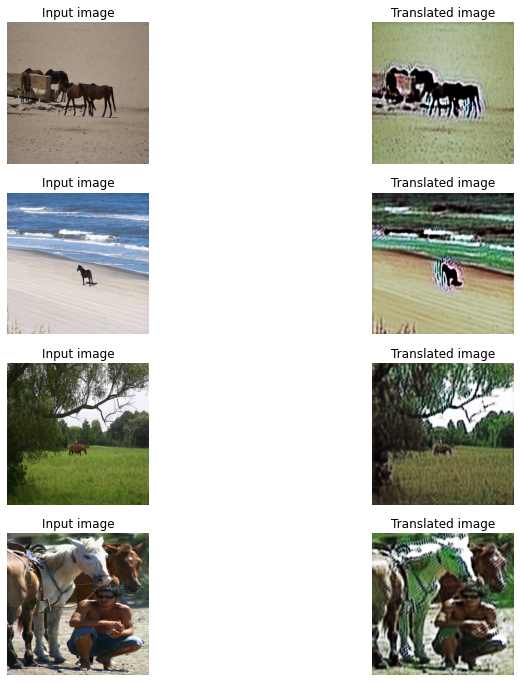

1067/1067 [==============================] - 705s 661ms/step - G_loss: 2.4000 - F_loss: 2.1117 - D_X_loss: 0.2373 - D_Y_loss: 0.1767
Epoch 2/20
1067/1067 [==============================] - ETA: 0s - G_loss: 1.8936 - F_loss: 1.7917 - D_X_loss: 0.2458 - D_Y_loss: 0.2331

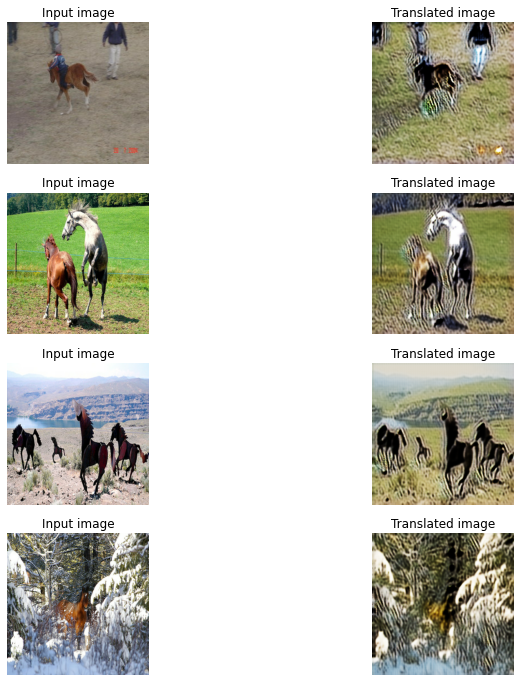

1067/1067 [==============================] - 701s 657ms/step - G_loss: 1.8935 - F_loss: 1.7914 - D_X_loss: 0.2459 - D_Y_loss: 0.2331
Epoch 3/20
1067/1067 [==============================] - ETA: 0s - G_loss: 1.7780 - F_loss: 1.7142 - D_X_loss: 0.2426 - D_Y_loss: 0.2207

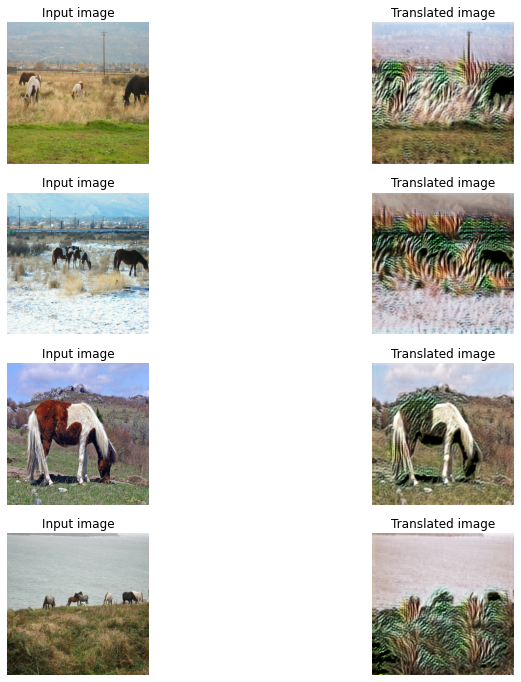

1067/1067 [==============================] - 700s 656ms/step - G_loss: 1.7779 - F_loss: 1.7143 - D_X_loss: 0.2427 - D_Y_loss: 0.2207
Epoch 4/20
1067/1067 [==============================] - ETA: 0s - G_loss: 1.6485 - F_loss: 1.6686 - D_X_loss: 0.2451 - D_Y_loss: 0.2341

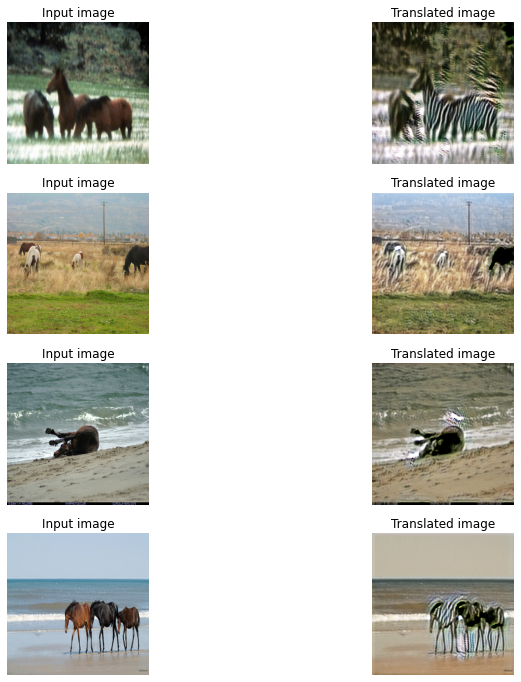

1067/1067 [==============================] - 701s 657ms/step - G_loss: 1.6486 - F_loss: 1.6686 - D_X_loss: 0.2452 - D_Y_loss: 0.2341
Epoch 5/20
1067/1067 [==============================] - ETA: 0s - G_loss: 1.5978 - F_loss: 1.6162 - D_X_loss: 0.2500 - D_Y_loss: 0.2342

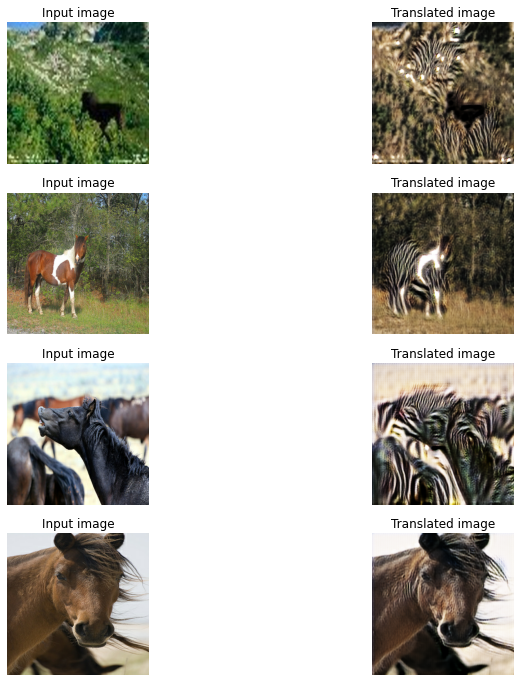

1067/1067 [==============================] - 701s 657ms/step - G_loss: 1.5973 - F_loss: 1.6164 - D_X_loss: 0.2501 - D_Y_loss: 0.2342
Epoch 6/20
1067/1067 [==============================] - ETA: 0s - G_loss: 1.5917 - F_loss: 1.5730 - D_X_loss: 0.2569 - D_Y_loss: 0.2311

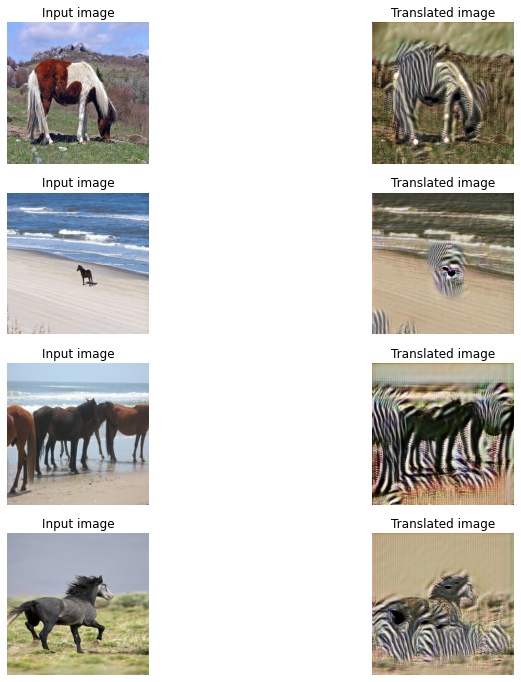

1067/1067 [==============================] - 700s 656ms/step - G_loss: 1.5915 - F_loss: 1.5730 - D_X_loss: 0.2569 - D_Y_loss: 0.2311
Epoch 7/20
1067/1067 [==============================] - ETA: 0s - G_loss: 1.5029 - F_loss: 1.5359 - D_X_loss: 0.2586 - D_Y_loss: 0.2403

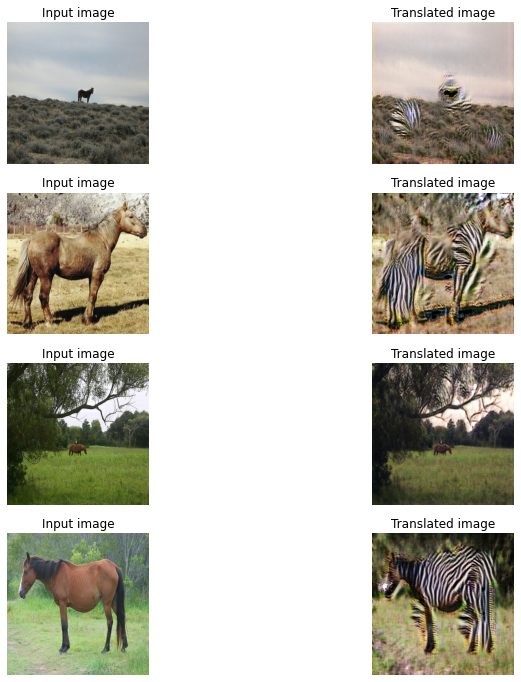

1067/1067 [==============================] - 699s 656ms/step - G_loss: 1.5027 - F_loss: 1.5357 - D_X_loss: 0.2587 - D_Y_loss: 0.2402
Epoch 8/20
1067/1067 [==============================] - ETA: 0s - G_loss: 1.4963 - F_loss: 1.5036 - D_X_loss: 0.2603 - D_Y_loss: 0.2333

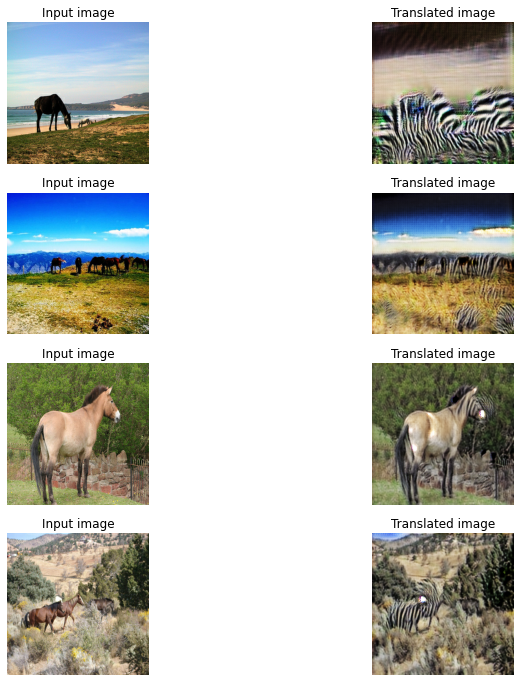

1067/1067 [==============================] - 699s 655ms/step - G_loss: 1.4965 - F_loss: 1.5035 - D_X_loss: 0.2603 - D_Y_loss: 0.2333
Epoch 9/20
1067/1067 [==============================] - ETA: 0s - G_loss: 1.5025 - F_loss: 1.4963 - D_X_loss: 0.2607 - D_Y_loss: 0.2328

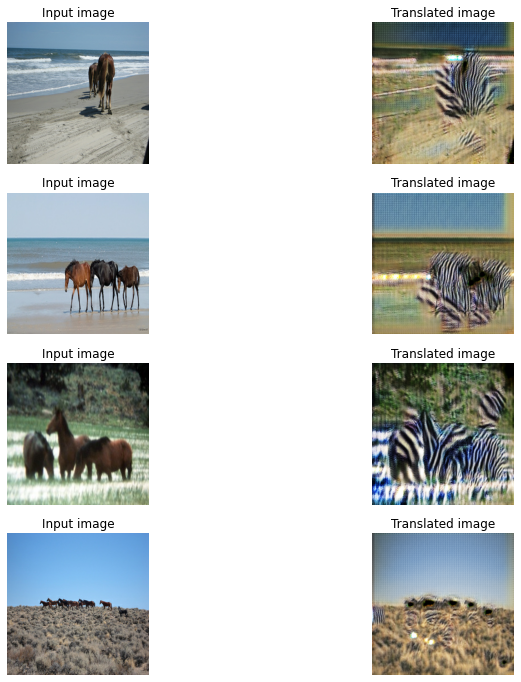

1067/1067 [==============================] - 700s 656ms/step - G_loss: 1.5025 - F_loss: 1.4974 - D_X_loss: 0.2606 - D_Y_loss: 0.2327
Epoch 10/20
1067/1067 [==============================] - ETA: 0s - G_loss: 1.4802 - F_loss: 1.4782 - D_X_loss: 0.2609 - D_Y_loss: 0.2240

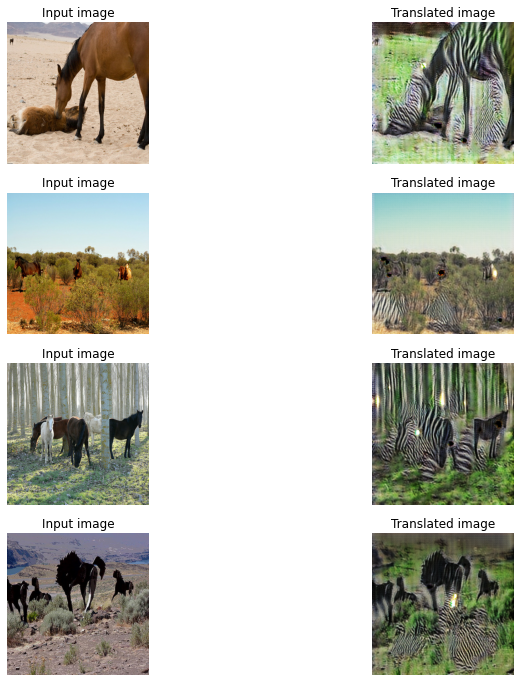

1067/1067 [==============================] - 699s 655ms/step - G_loss: 1.4801 - F_loss: 1.4780 - D_X_loss: 0.2609 - D_Y_loss: 0.2241
Epoch 11/20
1067/1067 [==============================] - ETA: 0s - G_loss: 1.4259 - F_loss: 1.4516 - D_X_loss: 0.2609 - D_Y_loss: 0.2414

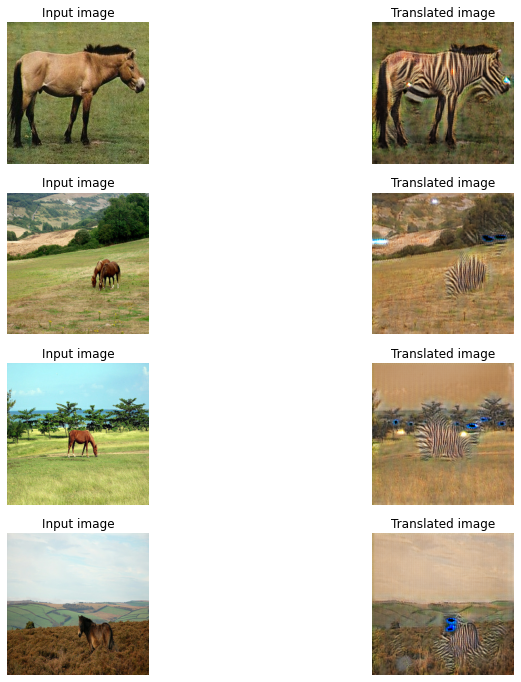

1067/1067 [==============================] - 699s 655ms/step - G_loss: 1.4255 - F_loss: 1.4516 - D_X_loss: 0.2610 - D_Y_loss: 0.2414
Epoch 12/20
1067/1067 [==============================] - ETA: 0s - G_loss: 1.3841 - F_loss: 1.4290 - D_X_loss: 0.2622 - D_Y_loss: 0.2472

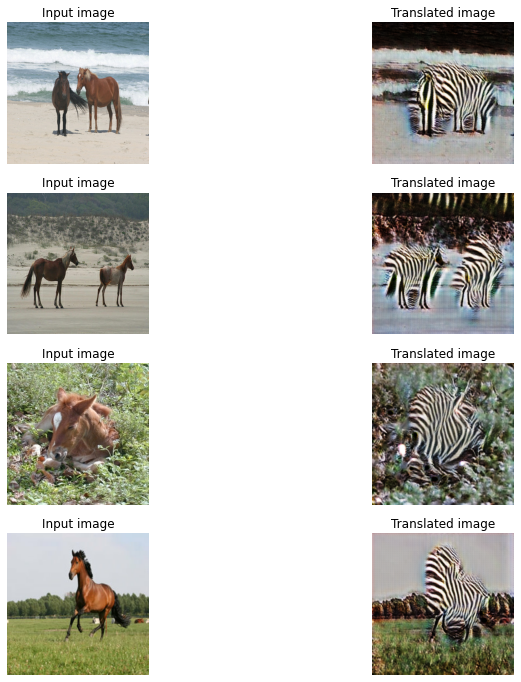

1067/1067 [==============================] - 699s 655ms/step - G_loss: 1.3840 - F_loss: 1.4287 - D_X_loss: 0.2622 - D_Y_loss: 0.2473
Epoch 13/20
1067/1067 [==============================] - ETA: 0s - G_loss: 1.3596 - F_loss: 1.4102 - D_X_loss: 0.2651 - D_Y_loss: 0.2502

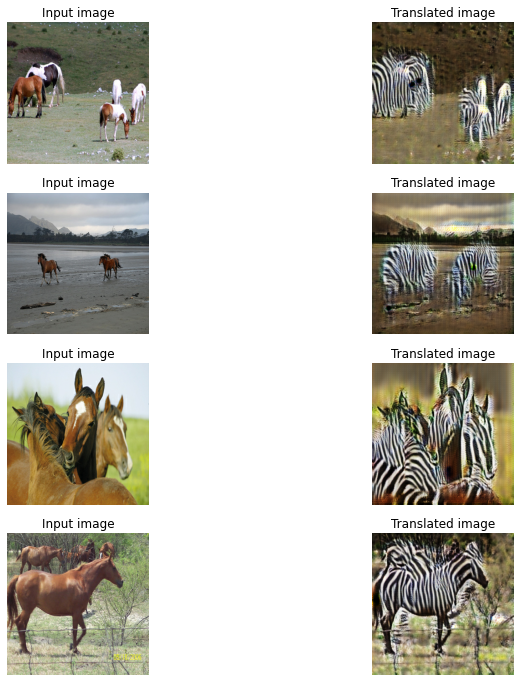

1067/1067 [==============================] - 698s 654ms/step - G_loss: 1.3594 - F_loss: 1.4102 - D_X_loss: 0.2652 - D_Y_loss: 0.2503
Epoch 14/20
1067/1067 [==============================] - ETA: 0s - G_loss: 1.3375 - F_loss: 1.3887 - D_X_loss: 0.2635 - D_Y_loss: 0.2509

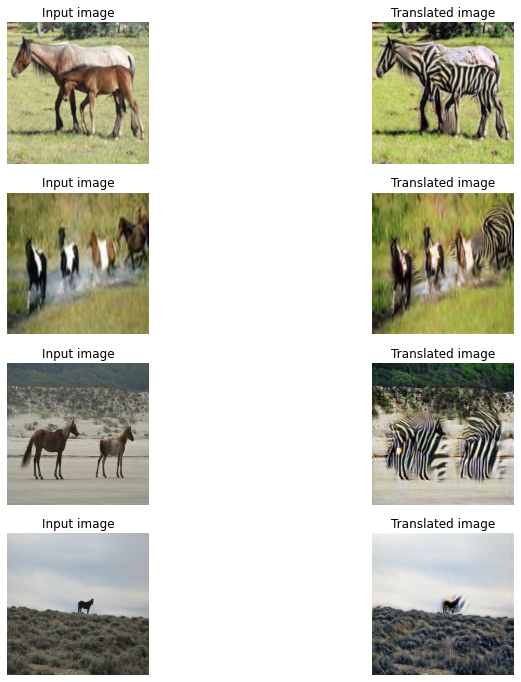

1067/1067 [==============================] - 699s 655ms/step - G_loss: 1.3377 - F_loss: 1.3887 - D_X_loss: 0.2635 - D_Y_loss: 0.2509
Epoch 15/20
1067/1067 [==============================] - ETA: 0s - G_loss: 1.3374 - F_loss: 1.3721 - D_X_loss: 0.2648 - D_Y_loss: 0.2433

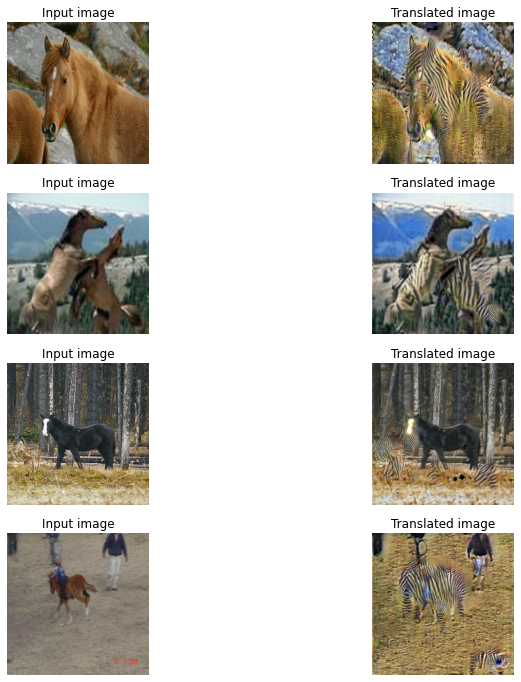

1067/1067 [==============================] - 699s 655ms/step - G_loss: 1.3374 - F_loss: 1.3722 - D_X_loss: 0.2648 - D_Y_loss: 0.2433
Epoch 16/20
1067/1067 [==============================] - ETA: 0s - G_loss: 1.3118 - F_loss: 1.3657 - D_X_loss: 0.2644 - D_Y_loss: 0.2513

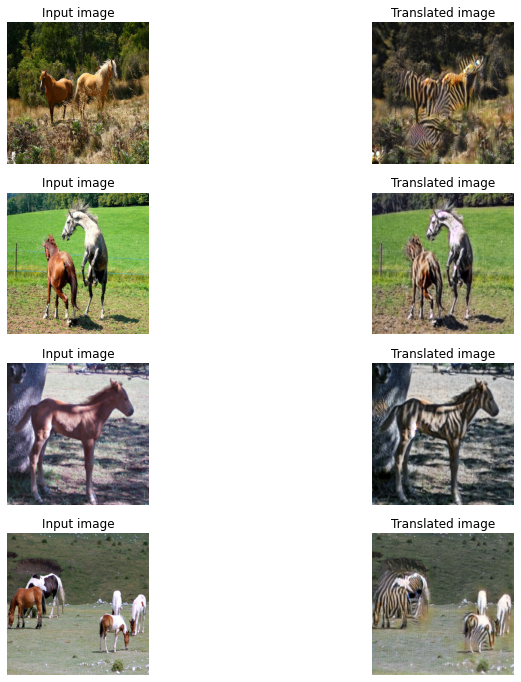

1067/1067 [==============================] - 699s 655ms/step - G_loss: 1.3117 - F_loss: 1.3656 - D_X_loss: 0.2646 - D_Y_loss: 0.2512
Epoch 17/20
1067/1067 [==============================] - ETA: 0s - G_loss: 1.2766 - F_loss: 1.3598 - D_X_loss: 0.2654 - D_Y_loss: 0.2500

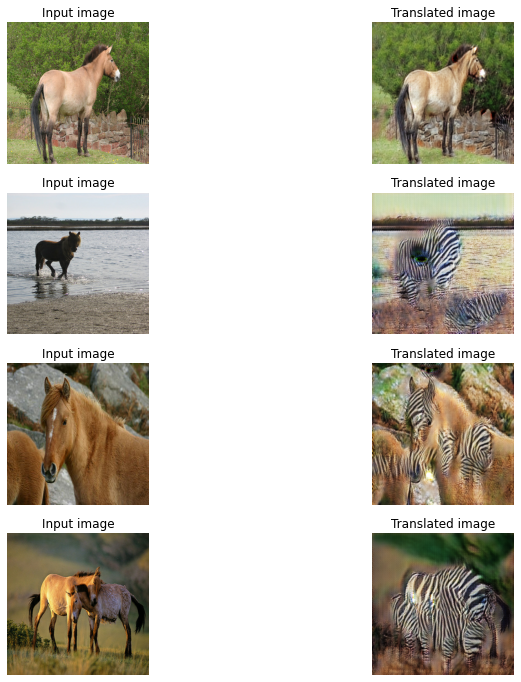

1067/1067 [==============================] - 699s 655ms/step - G_loss: 1.2766 - F_loss: 1.3596 - D_X_loss: 0.2654 - D_Y_loss: 0.2500
Epoch 18/20
1067/1067 [==============================] - ETA: 0s - G_loss: 1.2545 - F_loss: 1.3464 - D_X_loss: 0.2652 - D_Y_loss: 0.2540

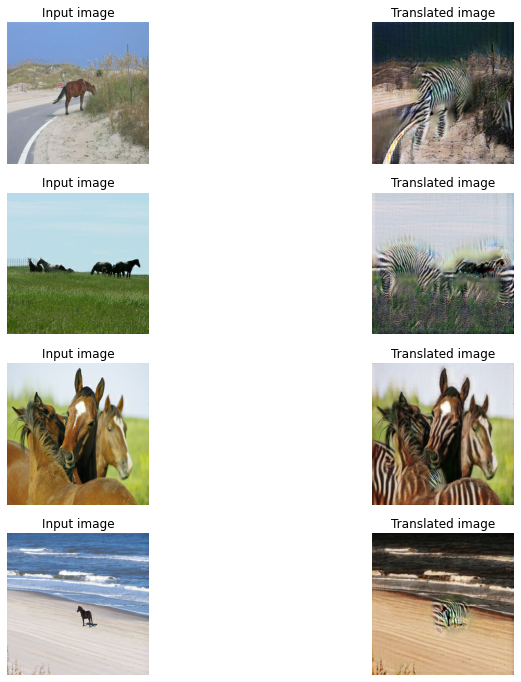

1067/1067 [==============================] - 699s 655ms/step - G_loss: 1.2548 - F_loss: 1.3466 - D_X_loss: 0.2652 - D_Y_loss: 0.2540
Epoch 19/20
1067/1067 [==============================] - ETA: 0s - G_loss: 1.2658 - F_loss: 1.3244 - D_X_loss: 0.2661 - D_Y_loss: 0.2460

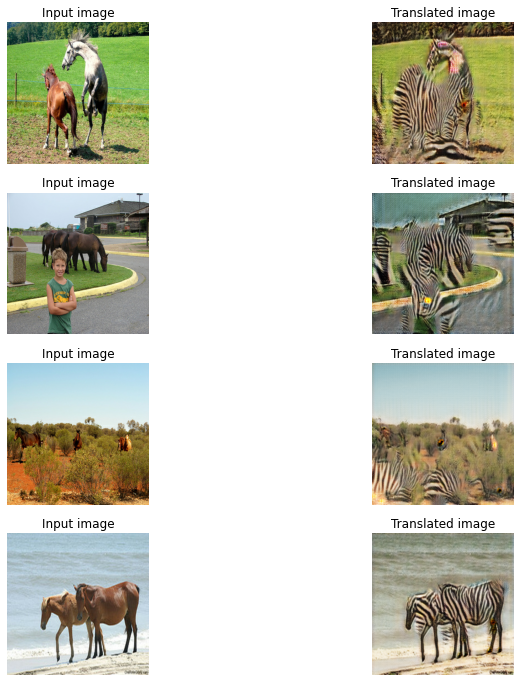

1067/1067 [==============================] - 698s 654ms/step - G_loss: 1.2657 - F_loss: 1.3237 - D_X_loss: 0.2661 - D_Y_loss: 0.2460
Epoch 20/20
 761/1067 [====================>.........] - ETA: 3:19 - G_loss: 1.2572 - F_loss: 1.2970 - D_X_loss: 0.2679 - D_Y_loss: 0.2491

In [ ]:
cycle_gan_model.fit(
    tf.data.Dataset.zip((train_horses, train_zebras)),
    epochs=20,
    callbacks=[plotter, model_checkpoint_callback],
)

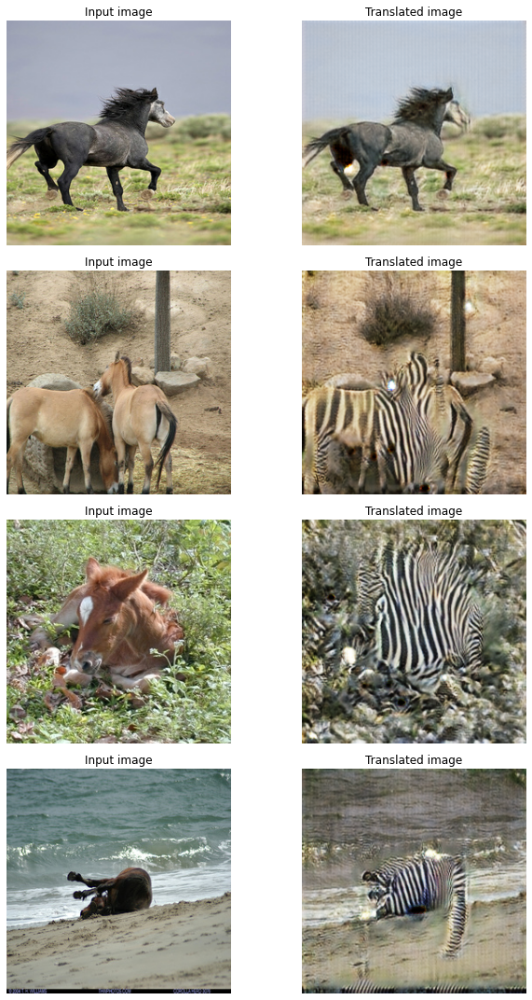

In [ ]:
_, ax = plt.subplots(4, 2, figsize=(10, 15))
for i, img in enumerate(test_horses.take(4)):
    prediction = cycle_gan_model.gen_G(img, training=False)[0].numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

    ax[i, 0].imshow(img)
    ax[i, 1].imshow(prediction)
    ax[i, 0].set_title("Input image")
    ax[i, 0].set_title("Input image")
    ax[i, 1].set_title("Translated image")
    ax[i, 0].axis("off")
    ax[i, 1].axis("off")

    prediction = keras.preprocessing.image.array_to_img(prediction)
    prediction.save("predicted_img_{i}.png".format(i=i))
plt.tight_layout()
plt.show()